<a href="https://colab.research.google.com/github/baussel/Satellite_Detection/blob/main/Image_Download.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#github repository sync in google colab
import os
try:
  # Colab only
  !git clone https://github.com/baussel/Satellite_Detection.git
  os.chdir('/content/data/HST_images')      
except Exception:
  pass

Cloning into 'Satellite_Detection'...
remote: Enumerating objects: 72, done.
remote: Counting objects: 100% (72/72), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 72 (delta 11), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (72/72), done.


In [2]:
'''
    Downloads HST raw images from a given list 
'''
from PIL import Image
import os
import numpy as np
from urllib.request import urlretrieve
from urllib.error import HTTPError
import urllib
import pandas as pd
from multiprocessing import Process
from multiprocessing.pool import ThreadPool
from multiprocessing import Pool
import time


def download_image(raw_id):
    try:
        print("https://hst-int.esac.esa.int/preview/ACS/"+str(raw_id))
        urlretrieve("https://hst-int.esac.esa.int/preview/ACS/"+str(raw_id), "/content/Satellite_Detection/data/HST_images/"+str(raw_id))
    except(urllib.error.HTTPError):
        pass
   

if __name__ == '__main__':
    data = pd.read_csv('/content/Satellite_Detection/data/HST_images/satellites_ACS.csv')
    print("Dataset contains",len(data),"images")
    numb_obs_ids = len(data)

    max_number = 20 #Maximum number of downloaded images
    print("Downloading the first",max_number,"images...")

    starttime = time.time()
    processes = []
    for i in range(0,max_number):
        download_image(data["raw_id"][i])
    print('That took {} seconds'.format(time.time() - starttime))

Dataset contains 7776 images
https://hst-int.esac.esa.int/preview/ACS/j59l54geq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j59l54ghq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j59l54gjq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j59l54grq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j59l54gwq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j59l54hpq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j6fl1elaq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j6fl1elvq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j6fl23pyq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j6fl23q5q_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j6fl6cilq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j6fl6cisq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j6fl6xfmq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j6fl6xfqq_flc.fits.jpg
https://hst-int.esac.esa.int/preview/ACS/j6fl6xfuq_flc.fits.jpg
https://hst

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import pathlib

In [5]:
path_images = "/content/Satellite_Detection/data/HST_images/"

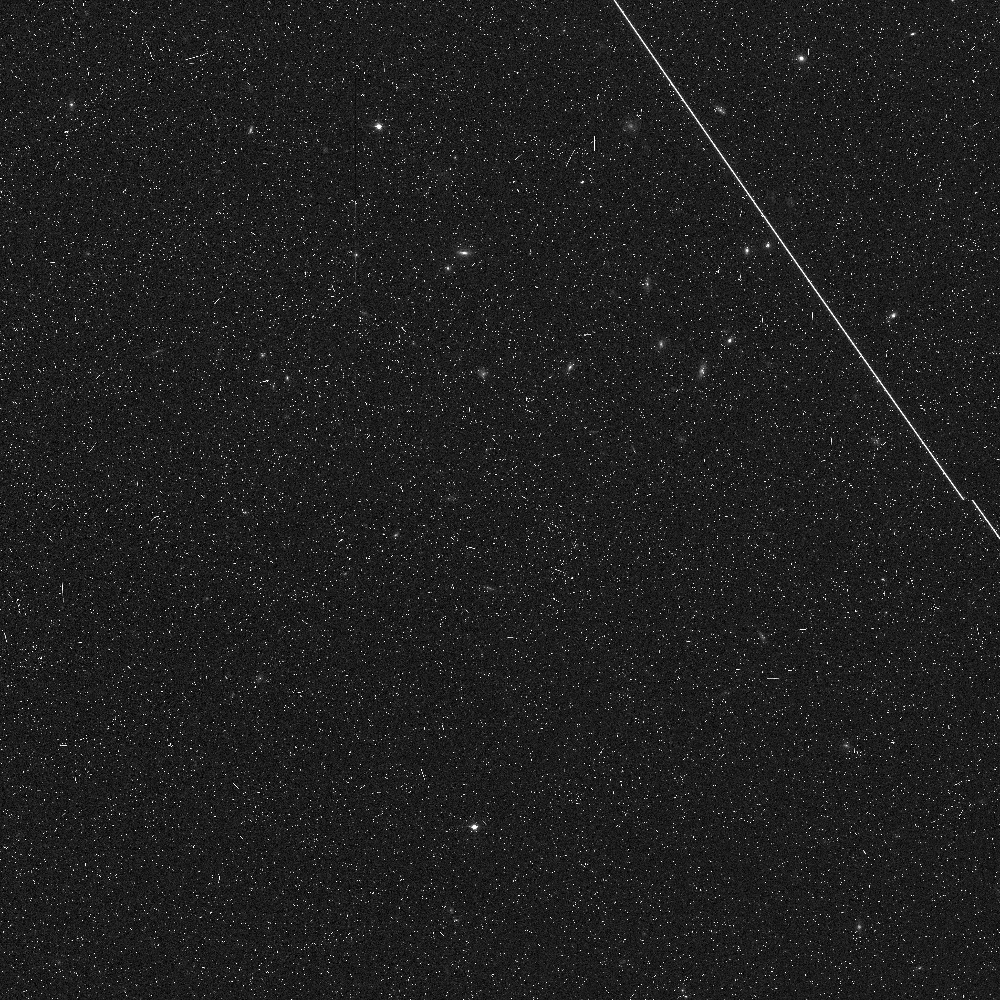

In [5]:
PIL.Image.open(path_images+"satellite/j6fl9aqtq_flc.fits.jpg")

## Create a dataset

Define some parameters for the loader:

In [2]:
batch_size = 1
img_height = 256
img_width = 256

It's good practice to use a validation split when developing your model. Let's use 80% of the images for training, and 20% for validation.

In [6]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  path_images,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width))
  #batch_size=batch_size)

Found 20 files belonging to 2 classes.
Using 16 files for training.


In [7]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  path_images,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 20 files belonging to 2 classes.
Using 4 files for validation.


You can find the class names in the `class_names` attribute on these datasets. These correspond to the directory names in alphabetical order.

In [8]:
class_names = train_ds.class_names
print(class_names)

['no_satellite', 'satellite']


## Visualize the data

Here are the first 9 images from the training dataset.

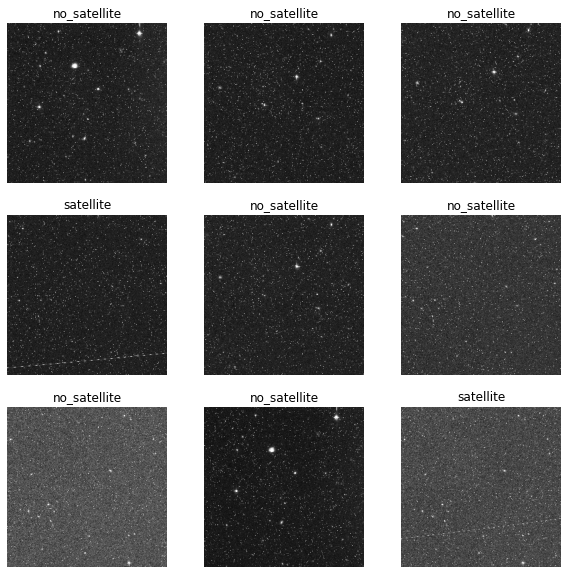

In [9]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

You will train a model using these datasets by passing them to `model.fit` in a moment. If you like, you can also manually iterate over the dataset and retrieve batches of images:

In [10]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(16, 256, 256, 3)
(16,)


In [11]:
num_classes = 5

model = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [12]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 256, 256, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 32, 32, 64)        0

In [14]:
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

In [15]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixels values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image)) 

0.0058823535 1.0


In [16]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/10
1/1 [==============================] - 33s 33s/step - loss: 1.6492 - accuracy: 0.3125 - val_loss: 0.8298 - val_accuracy: 0.5000
Epoch 2/10
1/1 [==============================] - 1s 1s/step - loss: 0.5409 - accuracy: 0.6875 - val_loss: 0.7758 - val_accuracy: 0.5000
Epoch 3/10
1/1 [==============================] - 1s 1s/step - loss: 1.0210 - accuracy: 0.3125 - val_loss: 3.9161 - val_accuracy: 0.5000
Epoch 4/10
1/1 [==============================] - 1s 1s/step - loss: 2.0857 - accuracy: 0.6875 - val_loss: 3.1256 - val_accuracy: 0.5000
Epoch 5/10
1/1 [==============================] - 1s 1s/step - loss: 1.4356 - accuracy: 0.6875 - val_loss: 1.5095 - val_accuracy: 0.5000
Epoch 6/10
1/1 [==============================] - 1s 1s/step - loss: 0.5372 - accuracy: 0.6875 - val_loss: 0.7843 - val_accuracy: 0.5000
Epoch 7/10
1/1 [==============================] - 1s 1s/step - loss: 0.3768 - accuracy: 1.0000 - val_loss: 0.6861 - val_accuracy: 0.5000
Epoch 8/10
1/1 [=======================

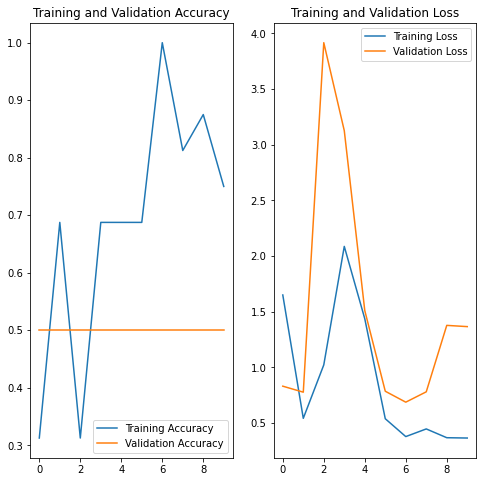

In [17]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [18]:
img = keras.preprocessing.image.load_img(
    path_images+"j6mf30l4q_flc.fits.jpg", target_size=(img_height, img_width)
)
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

This image most likely belongs to no_satellite with a 78.50 percent confidence.
